#**Surface Charge Density Distribution Assessment**

In [ ]:
!pip install biopython
!apt-get update
!apt-get install ncbi-blast+

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 22.3 MB/s eta 0:00:00
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,721 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:8 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,994 kB]
Get:9 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,953 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [3,264 kB]
Get:12 http://security.ubuntu.com/ubuntu

##Protein charge asymmetry

In [ ]:
from Bio.PDB import PDBParser
import numpy as np

def get_charge(atom):
    # Dictionary of approximate atomic charges based on AMBER/CHARMM
    charge_map = {
        "H": 0.33,  # Hydrogen (general)
        "C": 0.0,   # Carbon (neutral, as in alkanes)
        "N": -0.3,  # Nitrogen (partial negative)
        "O": -0.66, # Oxygen (highly electronegative)
        "S": -0.5,  # Sulfur (e.g., in cysteine, methionine)
        "P": 0.0,   # Phosphorus (e.g., in DNA backbones)
        "SE": -0.5, # Selenium (e.g., in selenocysteine)
        "FE": 2.0,  # Iron (heme or metal complexes)
        "MG": 2.0,  # Magnesium (positive ion)
        "ZN": 2.0,  # Zinc (positive ion)
        "CA": 2.0,  # Calcium (positive ion)
        "K": 1.0,   # Potassium (positive ion)
        "CL": -1.0, # Chlorine (negative ion)
        "F": -0.3,  # Fluorine (rare, but very electronegative)
        "BR": -0.1, # Bromine (less electronegative than Cl)
        "I": -0.05, # Iodine (rare in biological contexts)
    }
    atom_type = atom.element.upper()  # Get the atom's element, ensure uppercase
    return charge_map.get(atom_type, 0.0)  # Default to 0 if atom type not in charge_map

# Parse PDB file
parser = PDBParser()
structure = parser.get_structure("phiYS61", "phiYS61.pdb")

# Extract atomic coordinates and charges
atoms = [atom for atom in structure.get_atoms()]
coordinates = np.array([atom.coord for atom in atoms])  # Convert to NumPy array
charges = np.array([get_charge(atom) for atom in atoms])  # Convert to NumPy array

In [ ]:
# Define 3D grid
grid_size = 2
grid_points = np.linspace(-2, 2, grid_size)
grid = np.array(np.meshgrid(grid_points, grid_points, grid_points)).T.reshape(-1, 3)

# Compute potential at each grid point
epsilon = 80  # Dielectric constant of water
kappa = 1  # Debye-Hückel screening factor
potentials = np.zeros(len(grid))

for i, point in enumerate(grid):
    r = np.linalg.norm(coordinates - point, axis=1)  # Distance from grid point to each atom
    r += 1e-8  # Avoid division by zero
    potentials[i] = np.sum(charges / (epsilon * r + kappa))  # Simplified PB equation

# Reshape potentials for visualization
potentials_grid = potentials.reshape((grid_size, grid_size, grid_size))
print(potentials_grid)


[[[-0.24214896 -0.24558306]
  [-0.255346   -0.24695124]]

 [[-0.22830059 -0.23489797]
  [-0.22151921 -0.23110209]]]


In [ ]:
import numpy as np
from sklearn.decomposition import PCA

# Perform PCA to align the protein
pca = PCA(n_components=3)
aligned_coords = pca.fit_transform(coordinates)

# Divide the protein into regions
def segment_regions(coords, charges):
    # Example: Define octants by sign of (x, y, z)
    regions = {(x, y, z): [] for x in (-1, 1) for y in (-1, 1) for z in (-1, 1)}
    for coord, charge in zip(coords, charges):
        x_sign, y_sign, z_sign = np.sign(coord)
        regions[(x_sign, y_sign, z_sign)].append(charge)
    return regions

regions = segment_regions(aligned_coords, charges)

# Compute the variance in charge densities
charge_densities = [np.mean(region) for region in regions.values()]
asymmetry_score = np.var(charge_densities)
print("Asymmetry Score:", asymmetry_score)


Asymmetry Score: 0.00011396127578756369


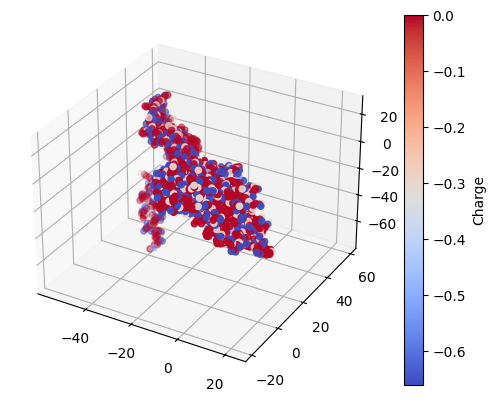

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for charges
charges = np.array(charges)
sc = ax.scatter(
    np.array(coordinates)[:, 0],
    np.array(coordinates)[:, 1],
    np.array(coordinates)[:, 2],
    c=charges,
    cmap='coolwarm'
)
plt.colorbar(sc, label="Charge")
plt.show()


##Electrostatic potential calculation

Asymmetry Score: -0.0208


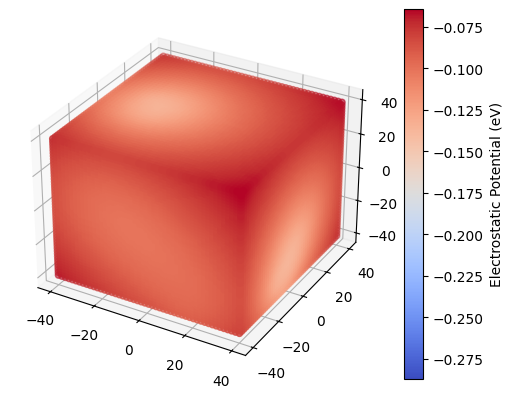

In [ ]:
from Bio.PDB import PDBParser
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

# Function to get atomic charges
def get_charge(atom):
    charge_map = {
        "H": 0.33, "C": 0.0, "N": -0.3, "O": -0.66, "S": -0.5, "P": 0.0, "SE": -0.5,
        "FE": 2.0, "MG": 2.0, "ZN": 2.0, "CA": 2.0, "K": 1.0, "CL": -1.0,
        "F": -0.3, "BR": -0.1, "I": -0.05
    }
    return charge_map.get(atom.element.upper(), 0.0)

# Function to calculate asymmetry score
def calculate_asymmetry_score(potentials, grid_points):
    left = grid_points[:, 0] < 0
    right = ~left
    top = grid_points[:, 1] > 0
    bottom = ~top
    front = grid_points[:, 2] > 0
    back = ~front

    # Sum potentials in each region
    V_left = np.sum(potentials[left])
    V_right = np.sum(potentials[right])
    V_top = np.sum(potentials[top])
    V_bottom = np.sum(potentials[bottom])
    V_front = np.sum(potentials[front])
    V_back = np.sum(potentials[back])

    # Calculate hemisphere asymmetry scores
    asymmetry_x = abs(V_left - V_right) / (V_left + V_right + 1e-8)
    asymmetry_y = abs(V_top - V_bottom) / (V_top + V_bottom + 1e-8)
    asymmetry_z = abs(V_front - V_back) / (V_front + V_back + 1e-8)

    # Aggregate the final score
    return (asymmetry_x + asymmetry_y + asymmetry_z) / 3

# Parse the PDB file
parser = PDBParser()
structure = parser.get_structure("phi29", "phi29.pdb")

# Extract atomic coordinates and charges
atoms = [atom for atom in structure.get_atoms()]
coordinates = np.array([atom.coord for atom in atoms])  # Convert to NumPy array
charges = np.array([get_charge(atom) for atom in atoms])  # Convert to NumPy array

# Define a 3D grid
grid_size = 50  # Adjusted for resolution
grid_points = np.linspace(-40, 40, grid_size)  # Adjusted grid bounds to protein size
grid = np.array(np.meshgrid(grid_points, grid_points, grid_points)).T.reshape(-1, 3)

# Compute potential at each grid point
epsilon = 80  # Dielectric constant of water
kappa = 1  # Debye-Hückel screening factor
potentials = np.zeros(len(grid))

for i, point in enumerate(grid):
    r = np.linalg.norm(coordinates - point, axis=1)  # Distance from grid point to each atom
    r += 1e-8  # Avoid division by zero
    potentials[i] = np.sum(charges / (epsilon * r + kappa))  # Simplified Debye-Hückel Poisson-Boltzmann equation

# Reshape potentials for visualization
potentials_grid = potentials.reshape((grid_size, grid_size, grid_size))

# Calculate asymmetry score
asymmetry_score = calculate_asymmetry_score(potentials, grid)
print(f"Asymmetry Score: {asymmetry_score:.4f}")

# Plot the electrostatic potential distribution
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    grid[:, 0], grid[:, 1], grid[:, 2],
    c=potentials,
    cmap="coolwarm",
    marker="o"
)
plt.colorbar(sc, label="Electrostatic Potential (eV)")
plt.show()


Octant Asymmetry Score: -0.0366


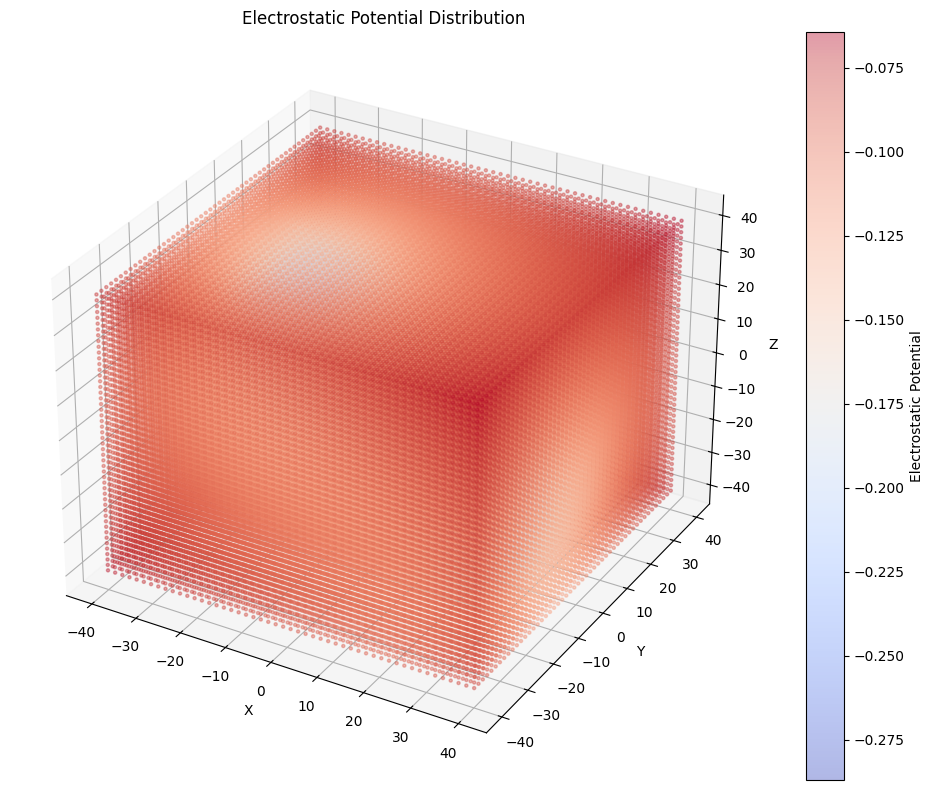

In [ ]:
# Octant-based approach
from Bio.PDB import PDBParser
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 1. Atomic Charge Assignment
def get_charge(atom):
    charge_map = {
        "H": 0.33, "C": 0.0, "N": -0.3, "O": -0.66, "S": -0.5, "P": 0.0, "SE": -0.5,
        "FE": 2.0, "MG": 2.0, "ZN": 2.0, "CA": 2.0, "K": 1.0, "CL": -1.0,
        "F": -0.3, "BR": -0.1, "I": -0.05
    }
    return charge_map.get(atom.element.upper(), 0.0)

# 2. Octant-Based Asymmetry Score Function
def calculate_octant_asymmetry(potentials, grid_points):
    epsilon = 1e-8
    masks = [
        (grid_points[:, 0] >= 0) & (grid_points[:, 1] >= 0) & (grid_points[:, 2] >= 0),  # O0
        (grid_points[:, 0] >= 0) & (grid_points[:, 1] >= 0) & (grid_points[:, 2] < 0),   # O1
        (grid_points[:, 0] >= 0) & (grid_points[:, 1] < 0) & (grid_points[:, 2] >= 0),   # O2
        (grid_points[:, 0] >= 0) & (grid_points[:, 1] < 0) & (grid_points[:, 2] < 0),    # O3
        (grid_points[:, 0] < 0) & (grid_points[:, 1] >= 0) & (grid_points[:, 2] >= 0),   # O4
        (grid_points[:, 0] < 0) & (grid_points[:, 1] >= 0) & (grid_points[:, 2] < 0),    # O5
        (grid_points[:, 0] < 0) & (grid_points[:, 1] < 0) & (grid_points[:, 2] >= 0),    # O6
        (grid_points[:, 0] < 0) & (grid_points[:, 1] < 0) & (grid_points[:, 2] < 0),     # O7
    ]

    octant_potentials = [np.sum(potentials[mask]) for mask in masks]

    # Opposing pairs: (O0-O7), (O1-O6), (O2-O5), (O3-O4)
    pairs = [(0, 7), (1, 6), (2, 5), (3, 4)]
    asymmetries = []
    for i, j in pairs:
        vi, vj = octant_potentials[i], octant_potentials[j]
        asym = abs(vi - vj) / (vi + vj + epsilon)
        asymmetries.append(asym)

    return np.mean(asymmetries)

# 3. Load and Process Structure
parser = PDBParser()
structure = parser.get_structure("phi29", "phi29.pdb")

atoms = [atom for atom in structure.get_atoms()]
coordinates = np.array([atom.coord for atom in atoms])
charges = np.array([get_charge(atom) for atom in atoms])

# 4. Set Up 3D Grid and Space
grid_size = 50
grid_range = np.linspace(-40, 40, grid_size)
grid = np.array(np.meshgrid(grid_range, grid_range, grid_range)).T.reshape(-1, 3)

# 5. Compute Electrostatics
epsilon = 80  # Dielectric constant
kappa = 1     # Screening factor
potentials = np.zeros(len(grid))

for i, point in enumerate(grid):
    r = np.linalg.norm(coordinates - point, axis=1)
    r += 1e-8  # Avoid divide-by-zero
    potentials[i] = np.sum(charges / (epsilon * r + kappa))

# 6. Compute Asymmetry Score
asymmetry_score = calculate_octant_asymmetry(potentials, grid)
print(f"Octant Asymmetry Score: {asymmetry_score:.4f}")

# 7. Visualize Electrostatics
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    grid[:, 0], grid[:, 1], grid[:, 2],
    c=potentials,
    cmap="coolwarm",
    marker="o",
    alpha=0.4,
    s=5
)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.colorbar(sc, label="Electrostatic Potential")
plt.title("Electrostatic Potential Distribution")
plt.tight_layout()
plt.show()

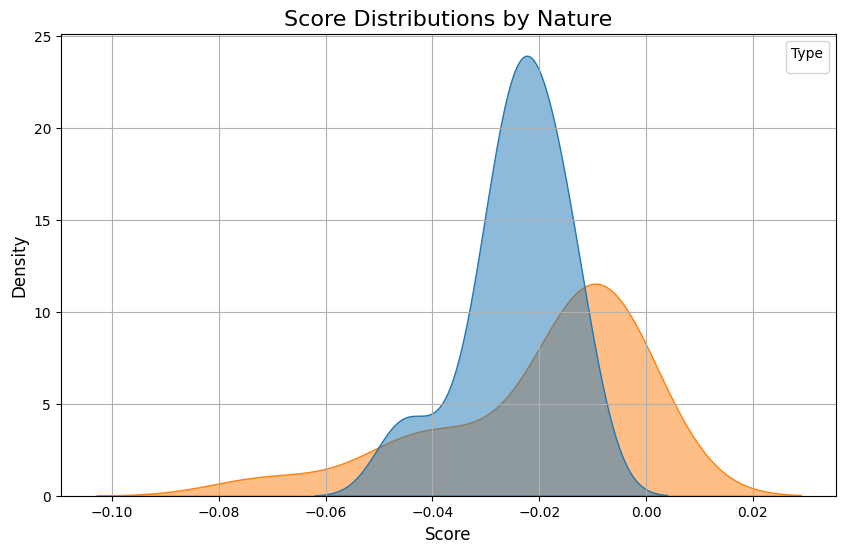

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Dataset loading
data = pd.read_csv("TP.csv")

# Step 2: Visualize the distributions
plt.figure(figsize=(10, 6))

# KDE plot for each type
sns.kdeplot(data=data, x="Score", hue="Nature", fill=True, alpha=0.5)

# Add labels and title
plt.title("Score Distributions by Nature", fontsize=16)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(title="Type")
plt.grid(True)
plt.show()


##Interactive 3D plots generation

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()

# Add scatter points for atoms
fig.add_trace(
    go.Scatter3d(
        x=coordinates[:, 0],
        y=coordinates[:, 1],
        z=coordinates[:, 2],
        mode='markers',
        marker=dict(
            size=6,
            color=charges,  # Color by charge
            colorscale='temps',  # Gradient color
            colorbar=dict(title="Charge"),
            opacity=0.8
        ),
        text=[f"Atom: {atom.element}, Charge: {charge:.2f}" for atom, charge in zip(atoms, charges)]
    )
)

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title="Interactive 3D Protein Charge Distribution",
    margin=dict(l=0, r=0, b=0, t=40)
)

# Show the figure
fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from Bio.PDB import PDBParser

# Step 1: Define charge mapping function
def get_charge(atom):
    charge_map = {
        "H": 0.33, "C": 0.0, "N": -0.3, "O": -0.66, "S": -0.5, "P": 0.0,
        "SE": -0.5, "FE": 2.0, "MG": 2.0, "ZN": 2.0, "CA": 2.0, "K": 1.0,
        "CL": -1.0, "F": -0.3, "BR": -0.1, "I": -0.05,
    }
    return charge_map.get(atom.element.upper(), 0.0)

# Step 2: Parse PDB file
parser = PDBParser()
structure = parser.get_structure("GC1", "GC1.pdb")

# Extract atomic coordinates and charges
atoms = [atom for atom in structure.get_atoms()]
coordinates = np.array([atom.coord for atom in atoms])
charges = np.array([get_charge(atom) for atom in atoms])

# Step 3: Define a 3D grid
grid_size = 50  # Adjust as needed for resolution
grid_points = np.linspace(-40, 40, grid_size)  # Adjust grid bounds to protein size
grid = np.array(np.meshgrid(grid_points, grid_points, grid_points)).T.reshape(-1, 3)

# Step 4: Compute potential at each grid point
epsilon = 80  # Dielectric constant of water
kappa = 1  # Debye-Hückel screening factor
potentials = np.zeros(len(grid))

for i, point in enumerate(grid):
    r = np.linalg.norm(coordinates - point, axis=1)  # Distance from grid point to each atom
    r += 1e-8  # Avoid division by zero
    potentials[i] = np.sum(charges / (epsilon * r + kappa))  # Simplified PB equation

# Normalize potentials for better visualization
potentials = np.clip(potentials, -5, 5)  # Clip extreme values for visualization

# Step 5: Interactive Plotly 3D scatter plot
fig = go.Figure()

# Add scatter points for grid potentials
fig.add_trace(
    go.Scatter3d(
        x=grid[:, 0],
        y=grid[:, 1],
        z=grid[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=potentials,  # Color by potential
            colorscale='Viridis',  # Gradient color for potential
            colorbar=dict(title="Electrostatic Potential"),
            opacity=0.6
        ),
        text=[f"Potential: {pot:.2f}" for pot in potentials]  # Hover text
    )
)

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    title="Interactive 3D Electrostatic Potential Field",
    margin=dict(l=0, r=0, b=0, t=40)
)

# Show the figure
fig.show()


In [ ]:
# Compute asymmetry scores from the potentials grid
def calculate_asymmetry_score(potentials_grid, grid_points):
    # Split grid points into left/right, top/bottom, front/back
    left = grid_points[:, 0] < 0
    right = ~left
    top = grid_points[:, 1] > 0
    bottom = ~top
    front = grid_points[:, 2] > 0
    back = ~front

    # Sum potentials for each region
    V_left = np.sum(potentials_grid[left])
    V_right = np.sum(potentials_grid[right])
    V_top = np.sum(potentials_grid[top])
    V_bottom = np.sum(potentials_grid[bottom])
    V_front = np.sum(potentials_grid[front])
    V_back = np.sum(potentials_grid[back])

    # Calculate asymmetry scores for each axis
    asymmetry_x = abs(V_left - V_right) / (V_left + V_right + 1e-8)
    asymmetry_y = abs(V_top - V_bottom) / (V_top + V_bottom + 1e-8)
    asymmetry_z = abs(V_front - V_back) / (V_front + V_back + 1e-8)

    # Aggregate score
    final_asymmetry_score = (asymmetry_x + asymmetry_y + asymmetry_z) / 3
    return final_asymmetry_score

# Example usage
asymmetry_score = calculate_asymmetry_score(potentials, grid)
print("Asymmetry Score:", asymmetry_score)


Asymmetry Score: -0.020766237818266777
